In [91]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso,Ridge
from sklearn.metrics import mean_squared_error,mean_absolute_error,roc_curve,roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score,KFold,RepeatedKFold
from sklearn.preprocessing import MinMaxScaler
import joblib
import warnings
warnings.filterwarnings('ignore')

In [15]:
df=pd.read_csv('data.csv') #loading the data set
pd.set_option('display.max_columns', None) ##to display all the columns
pd.set_option('display.max_rows', None) ##to display all the Rows

In [16]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [17]:
df.shape

(7752, 25)

### Observation:-
1. Dataset has 23 independent variable/feature and 2 dependent variable/target.
2. 7752 values we have , will devide this value in train and test dataset for further processing.

In [18]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


### Observation:-
1. Count is different for multiple columns, it means that dataset contain null/missing values.
2. Means and Median of all column are almost same or having very little difference hence we can say data set has very less skewwness in some column.we will check skewness in futher steps as well.
3. No abnormal difference in mean and Max value hence there is no outlier present in this data set, we will check outlier in further steps as well.

In [19]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

<AxesSubplot:>

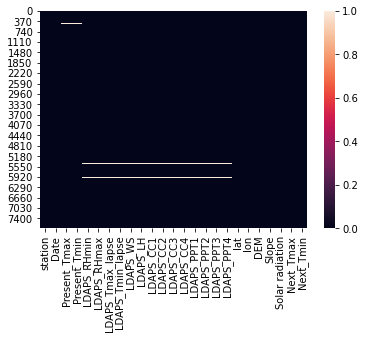

In [20]:
import seaborn as sns
sns.heatmap(df.isnull())

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


## Observation:- 
1. only one object type variable exist in this dataset which is Date column, We can delete this column because date will not be helpfull in temprature prediction.


<AxesSubplot:>

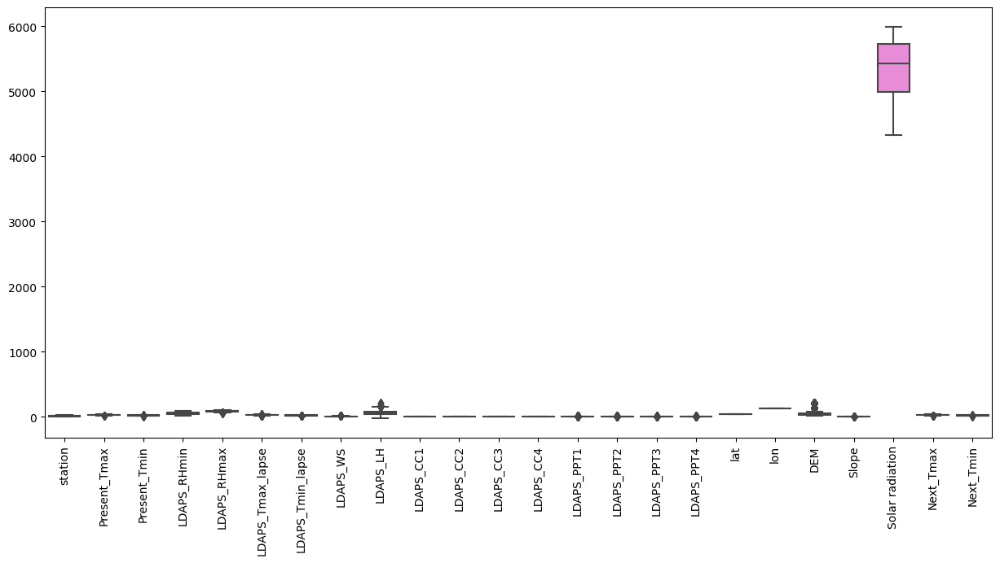

In [22]:
plt.figure(figsize=(15,7),dpi=100)
plt.xticks(rotation=90)
sns.boxplot(data = df)

## Observation:-
No Outlier present in this dataset.

In [23]:
df = df.drop(['Date'], axis = 1)

In [24]:
from sklearn.impute import SimpleImputer 
imp = SimpleImputer(missing_values=np.nan,strategy="median")
column = df.columns
df=imp.fit_transform(df)
df = pd.DataFrame(df,columns=column)

<AxesSubplot:>

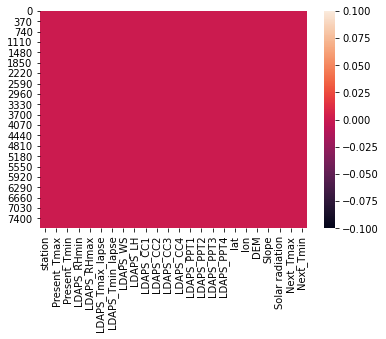

In [25]:
sns.heatmap(df.isnull())

### Observation:-
Null values removed from dataset.

<AxesSubplot:>

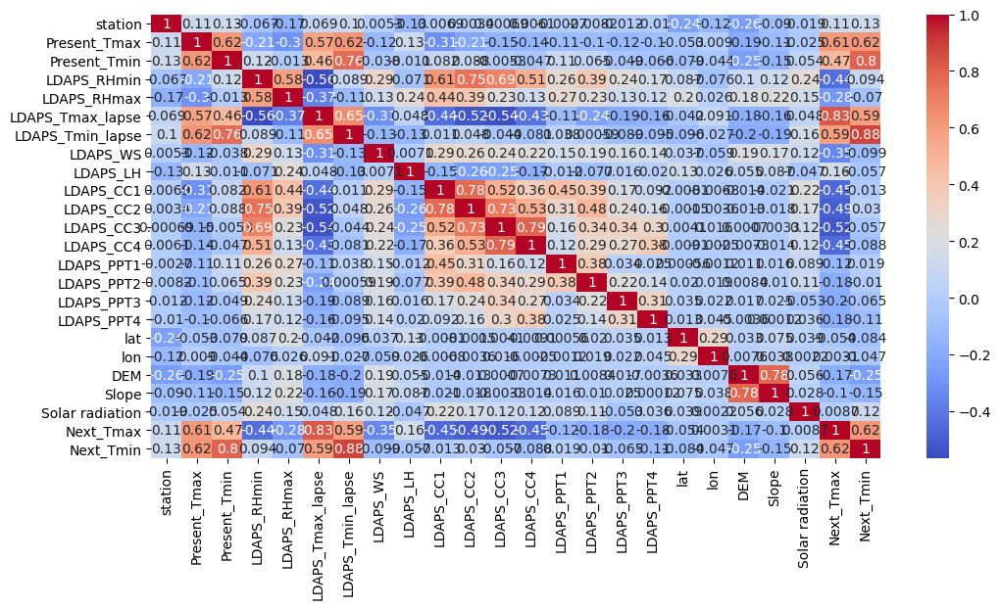

In [26]:
corr_df = df.corr(method='pearson')
plt.figure(figsize=(12,6),dpi=100)
sns.heatmap(corr_df,cmap='coolwarm',annot=True)

## Observation:- 
1. LDAPS_Tmax_lapse and LDAPS_Tmin_lapse , Present_Tmax, Present_Tmax has high possiive correlation with Next_Tmax and Next_Tmin,
2. Next_Tmax and Next_Tmin also has strong prossitive correlation with each other.
3. Next_Tmax has strong Negative Correlation with LDAPS_RHmin, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4,

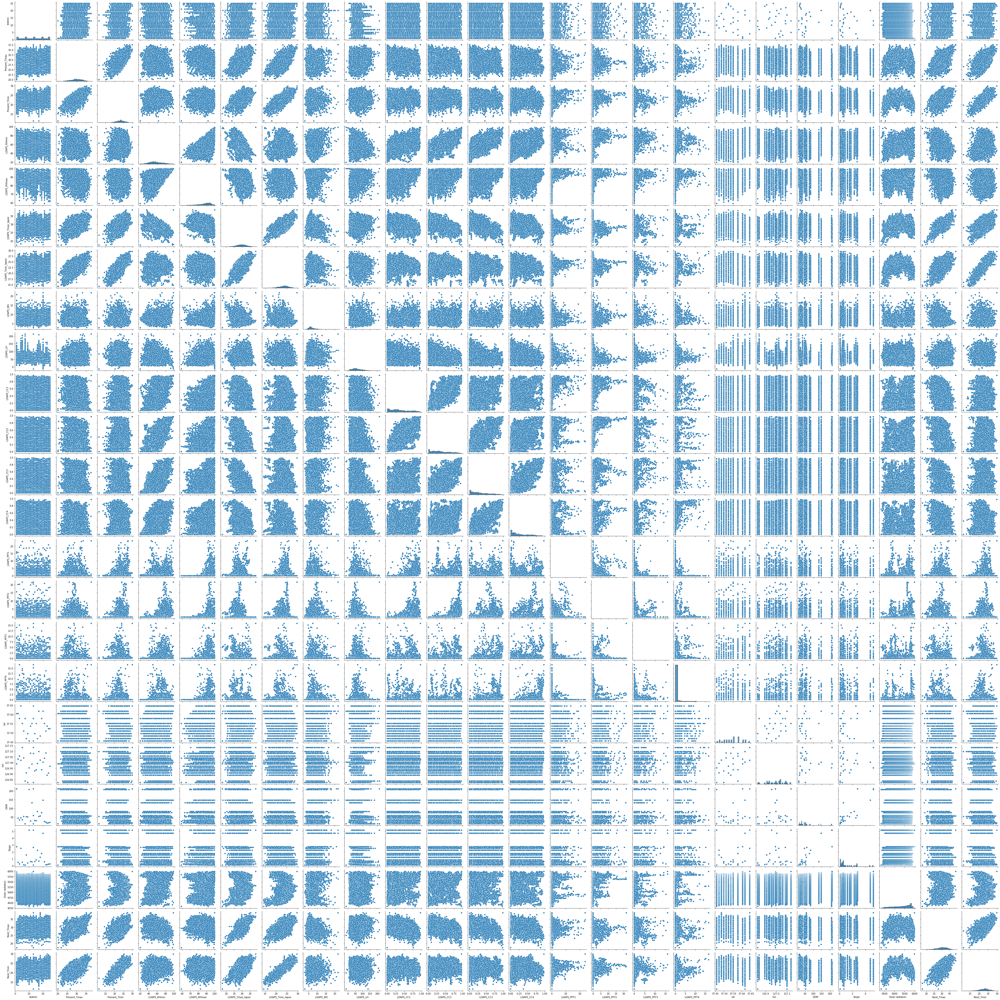

In [28]:
sns.pairplot(df)

## Observation:-
1. High correlated columns shows linear relation with Next_Tmax and Next_Tmin. graph has lots of column hence we will plot these graph in next section in by varient analysis.
2. columns having possitive correlated  with max and min temprature has correlation with other variable in dataset.

### Univerient Analysis

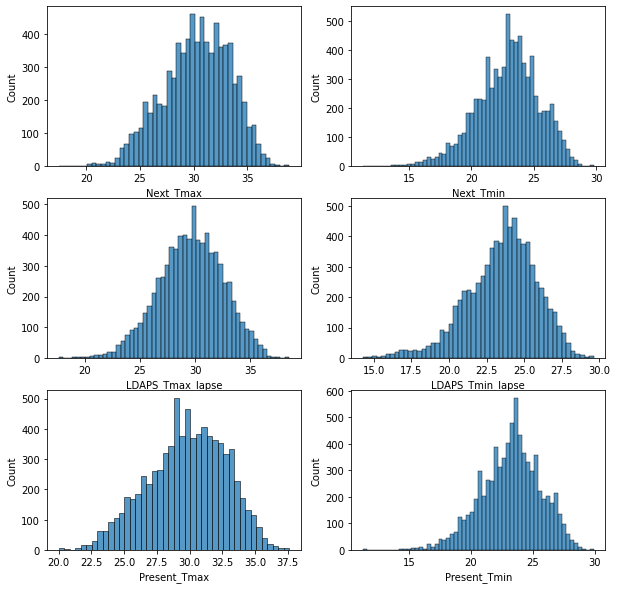

In [71]:

col_list = ['Next_Tmax','Next_Tmin','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','Present_Tmax','Present_Tmin']
#fig,axes = plt.subplots(3,2,figsize=(10,10),sharex=True, sharey=True)
plt.figure(figsize=(10, 10))
for i, val in enumerate(col_list):
    plt.subplot(3,2,i+1)
    ax = sns.histplot(df[val],stat='count')

## Observation:-
1. Next Min Tampratur vary from 20 to 40, highest no of day days Max taprature of this region is vary around 28 to 30 degree.
2. Min tamprature vary from 10 degree to 30 degree, highest no of day days min temprature remain between 20 to 25 degree.

### Bivarient Analysis

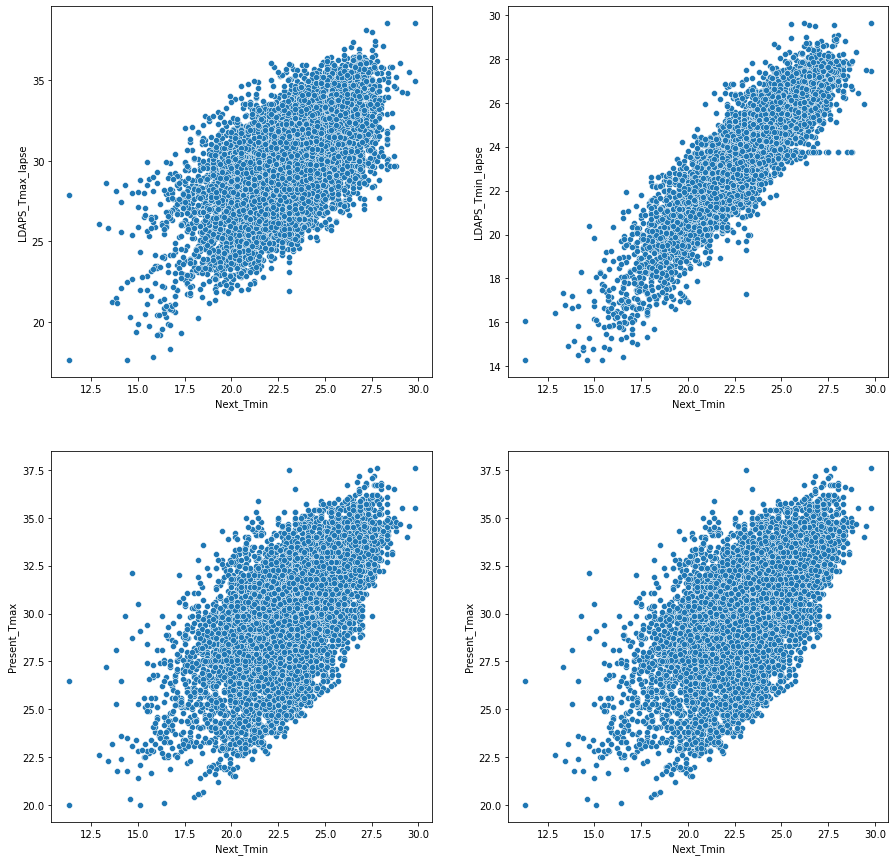

In [41]:
fig,axes = plt.subplots(2,2,figsize=(15,15))
x_col = 'Next_Tmin'
col_list = ['LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','Present_Tmax','Present_Tmax']
for i, var in enumerate(col_list):
    row = i//2
    pos = i % 2    
    plot = sns.scatterplot(x=df[x_col], y=df[var], ax=axes[row][pos])

# Observation:-

Tamprature has liear relation ship with LDAP and previous days Temprature.

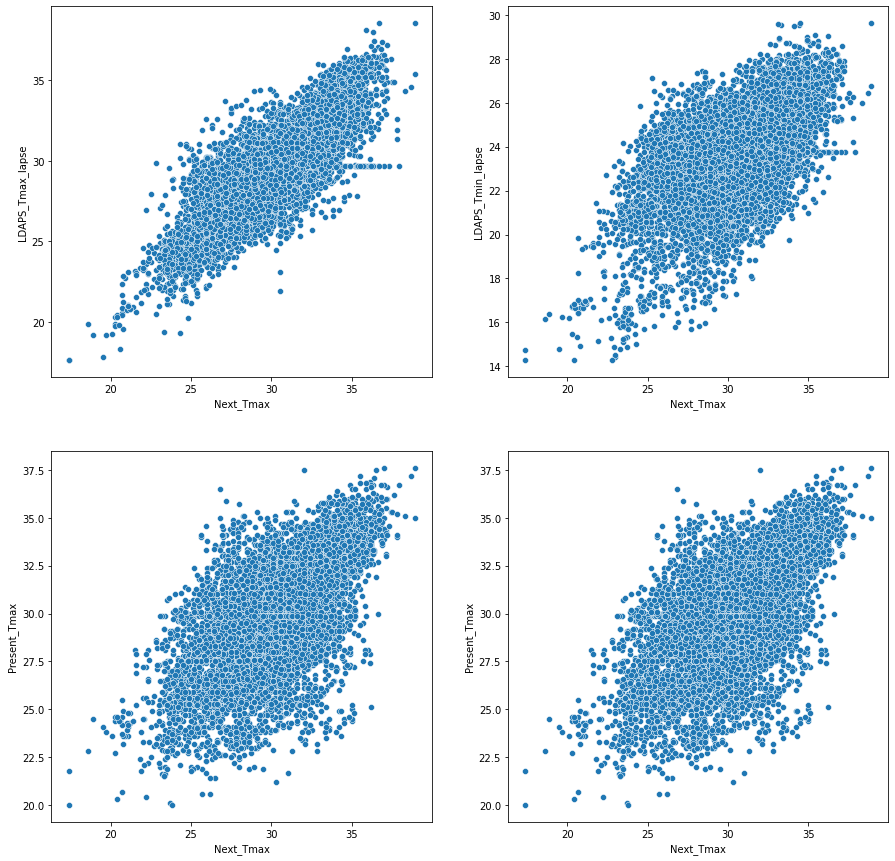

In [40]:
fig,axes = plt.subplots(2,2,figsize=(15,15))
x_col = 'Next_Tmax'
col_list = ['LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','Present_Tmax','Present_Tmax']
for i, var in enumerate(col_list):
    row = i//2
    pos = i % 2    
    plot = sns.scatterplot(x=df[x_col], y=df[var], ax=axes[row][pos])
    

# Observation:-

Tamprature has liear relation ship with LDAP and previous days Temprature.

## Split x and y

In [93]:
x = df.drop(['Next_Tmax','Next_Tmin'], axis=1)
y = df[df.columns[22:]]

In [94]:
y.head()

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5


In [95]:
x.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246


In [96]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)

In [97]:
maxAccu = 0
maxRS = 0
for i in range(1,300):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30,random_state=i)
    LR = LinearRegression()
    LR.fit(x_train,y_train)
    predrf = LR.predict(x_test)
    acc = r2_score(y_test, LR.predict(x_test))
    if acc >maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is", maxAccu, "on Random_state",maxRS)

Best accuracy is 0.8123748178506072 on Random_state 160


In [98]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=160)

In [99]:
x_train.shape

(6201, 22)

In [100]:
y_train.shape

(6201, 2)

In [105]:
lm = LinearRegression()
lm.fit(x_train,y_train)
lm.score(x_train,y_train)
#predict the value
y_pred = lm.predict(x_test)
print("R2 Score", r2_score(y_test, y_pred))
print("Score ",lm.score(x_test,y_test) )
print('Mean absolute error', mean_absolute_error(y_test,y_pred))
print('Mean Squared error:', mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,y_pred)))

R2 Score 0.8240167726856945
Score  0.8240167726856945
Mean absolute error 0.9314790989135877
Mean Squared error: 1.5274487203406655
Root Mean Squared Error: 1.2358999637271075


In [106]:
scores = cross_val_score(lm, x_train, y_train,scoring='r2', cv=4 )
scores.mean()

0.7913452349353357

In [84]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train, y_train)
y_pred = rf.predict(x_test)
print("R2 Score", r2_score(y_test, y_pred))
print("Score ",rf.score(x_test, y_test) )
print('Mean absolute error', mean_absolute_error(y_test,y_pred))
print('Mean Squared error:', mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,y_pred)))

R2 Score 0.9055935702519851
Score  0.9055935702519851
Mean absolute error 0.6715805931656995
Mean Squared error: 0.7938469951644103
Root Mean Squared Error: 0.8909809173963325


In [85]:
scores = cross_val_score(rf, x_train, y_train,scoring='r2', cv=4 )
scores.mean()

0.8825952538922484

In [86]:
from sklearn.linear_model import Lasso,Ridge
ls = Lasso(alpha=0.0001,normalize=True)    ## Alpha Value we get from best parameter tuning using Gridsearch CV, before this we use below comment alpha value 0.5
#ls=lasso(alpha=0.05) #default
ls.fit(x_train,y_train)
y_pred = ls.predict(x_test)
print("R2 Score", r2_score(y_test, y_pred))
print("Score ",ls.score(x_test,y_test) )
print('Mean absolute error', mean_absolute_error(y_test,y_pred))
print('Mean Squared error:', mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,y_pred)))

R2 Score 0.8230666306276317
Score  0.8230666306276317
Mean absolute error 0.9335849264084537
Mean Squared error: 1.5359897629221613
Root Mean Squared Error: 1.2393505407761605


In [87]:
scores = cross_val_score(ls, x_train, y_train, cv=4, scoring='r2')
scores.mean()

0.7913008354874299

In [88]:
#try to minimize the coeefocoent variance 
rd = Ridge(alpha=0.001, normalize=True)
#rd.Ridge()
rd.fit(x_train,y_train)
y_pred = rd.predict(x_test)
print("R2 Score", r2_score(y_test, y_pred))
print("Score ",rd.score(x_train,y_train) )
print('Mean absolute error', mean_absolute_error(y_test,y_pred))
print('Mean Squared error:', mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,y_pred)))

R2 Score 0.8239939215102672
Score  0.793715488831628
Mean absolute error 0.9314561562749459
Mean Squared error: 1.5275867484723806
Root Mean Squared Error: 1.2359558036080338


In [89]:
scores = cross_val_score(rd, x_train, y_train, cv=4, scoring='r2')
scores.mean()

0.7913492983691847

In [90]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

#alphas = np.arange(0, 1, 0.01)model = RandomForestRegressor()
model = RandomForestRegressor()
parameters = {"n_estimators":[100,200], "criterion":["mse","mae"],
              "max_depth":[8,20],"min_samples_split":[2,3]
            ,"max_features":['auto'],"min_samples_leaf":[2,3] }

#search = GridSearchCV(model, parameters, scoring='r2', cv=4,verbose=4, n_jobs=-1)
search =RandomizedSearchCV(model, param_distributions = parameters, n_iter = 100, cv = 2, scoring='r2',verbose=4, random_state=120, n_jobs = -1)
results = search.fit(x, y)

# summarize
print('R2: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

# predict y_test using model with best parameters
y_pred = search.predict(x_test)
print("R2 Score", r2_score(y_test, y_pred))
print("Score ",rd.score(x_train,y_train) )
print('Mean absolute error', mean_absolute_error(y_test,y_pred))
print('Mean Squared error:', mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,y_pred)))

Fitting 2 folds for each of 32 candidates, totalling 64 fits
R2: 0.708
Config: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 20, 'criterion': 'mse'}
R2 Score 0.9789155375363585
Score  0.793715488831628
Mean absolute error 0.30564001468470514
Mean Squared error: 0.17519756696912
Root Mean Squared Error: 0.41856608435122883


### Random forest R2 score is showing 97% accuracy with hyper tuned parameter. we will save this model.

# Saving model


In [108]:
import joblib 
joblib.dump(ls,'Temprature-forecast.pki')

['Temprature-forecast.pki']

In [109]:
model = joblib.load('Temprature-forecast.pki')

In [110]:
prediction = model.predict(x_test)

ds_pred = pd.DataFrame(prediction)

In [115]:
## Round off the values with 2 decimal numbers
result = pd.DataFrame(np.round(ds_pred, decimals=2))

In [116]:
result

,0,1
0,25.76,21.81
1,32.53,24.17
2,22.41,16.45
3,24.91,16.79
4,26.08,21.31
5,30.39,24.47
6,29.97,20.84
7,31.52,24.46
8,31.24,24.12
9,30.36,20.44
